In [1]:
# Importing Numpy and Pandas library

import numpy as np
import pandas as pd

# importing json to read json file

import json

# Importing seaborn and matplotlib library for Data Visualisation

import matplotlib.pyplot as plt 
import seaborn as sns

# Importing stats and chi2_contingency for statistical computation
from scipy import stats
from scipy.stats import chi2_contingency

In [2]:
# Importing 'demographics.txt' data set for the case study

demography = pd.read_csv('D:\Python\Retail Sales\demographics.txt', sep="\t")

In [3]:
demography.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Country
0,1826,1970,Graduation,Divorced,"$84,835.00",0,0,6/16/14,SP
1,1,1961,Graduation,Single,"$57,091.00",0,0,6/15/14,CA
2,10476,1958,Graduation,Married,"$67,267.00",0,1,5/13/14,US
3,1386,1967,Graduation,Together,"$32,474.00",1,1,5/11/14,AUS
4,5371,1989,Graduation,Single,"$21,474.00",1,0,4/8/14,SP


In [4]:
# Importing 'behaviour.JSON' data set for the case study

# Define the file path
file_path_behaviour = 'D:/Python/Retail Sales/behaviour.JSON'
file_path_campaign = 'D:/Python/Retail Sales/campaign.JSON'

# Open and read the behaviour.JSON file
with open(file_path_behaviour, 'r', encoding='utf-8') as file:
    behaviour_json = json.load(file)

# Normalize JSON data to a DataFrame
# Since the JSON data has keys for each ID, we need to flatten it correctly
data = []
for entry in behaviour_json:
    for key, value in entry.items():
        value['ID'] = key
        data.append(value)

behaviour = pd.DataFrame(data)

In [5]:
behaviour.head()

,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,ID
0,0,189,104,379,111,189,218,1,4,4,6,1,ID_1826
1,0,464,5,64,7,0,37,1,7,3,7,5,ID_1
2,0,134,11,59,15,2,30,1,3,2,5,2,ID_10476
3,0,10,0,1,0,0,0,1,1,0,2,7,ID_1386
4,0,6,16,24,11,0,34,2,3,1,2,7,ID_5371


In [6]:
# Importing 'campaign.JSON' data set for the case study

# Define the file path
file_path_campaign = 'D:/Python/Retail Sales/campaign.JSON'

# Open and read the campaign.JSON file
with open(file_path_campaign, 'r', encoding='utf-8') as file:
    campaign_json = json.load(file)

# Normalize JSON data to a DataFrame
# Since the JSON data has keys for each ID, we need to flatten it correctly
data = []
for entry in campaign_json:
    for key, value in entry.items():
        value['ID'] = key
        data.append(value)

campaign = pd.DataFrame(data)

In [7]:
campaign.head()

,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Response,Complain,ID
0,0,0,0,0,0,1,0,ID_1826
1,0,1,0,0,0,1,0,ID_1
2,0,0,0,0,0,0,0,ID_10476
3,0,0,0,0,0,0,0,ID_1386
4,0,0,1,0,0,1,0,ID_5371


In [8]:
# Checkin the shape of each file

print("Shape of Demography:", demography.shape)
print("Shape of Behaviour:", behaviour.shape)
print("Shape of Campaign:", campaign.shape)

Shape of Demography: (2240, 9)
Shape of Behaviour: (2240, 13)
Shape of Campaign: (2240, 8)


# Data Quality and Check (Task 1)
1. Creating a consolidated view of data by joining the data present in Demography, behaviour, campaign

In [9]:
# Convert IDs in behaviour and campaign to match demography IDs
behaviour['ID'] = behaviour['ID'].apply(lambda x: int(x.split('_')[1]))
campaign['ID'] = campaign['ID'].apply(lambda x: int(x.split('_')[1]))

In [10]:
# Merge the DataFrames

sale = demography.merge(behaviour, on='ID').merge(campaign, on='ID')

In [11]:
sale.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Country,Recency,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Response,Complain
0,1826,1970,Graduation,Divorced,"$84,835.00",0,0,6/16/14,SP,0,...,4,6,1,0,0,0,0,0,1,0
1,1,1961,Graduation,Single,"$57,091.00",0,0,6/15/14,CA,0,...,3,7,5,0,1,0,0,0,1,0
2,10476,1958,Graduation,Married,"$67,267.00",0,1,5/13/14,US,0,...,2,5,2,0,0,0,0,0,0,0
3,1386,1967,Graduation,Together,"$32,474.00",1,1,5/11/14,AUS,0,...,0,2,7,0,0,0,0,0,0,0
4,5371,1989,Graduation,Single,"$21,474.00",1,0,4/8/14,SP,0,...,1,2,7,0,0,1,0,0,1,0


2. Are there any variables where you will need to clean the raw data, what kind of cleaning will be needed?

In [12]:
# Checking shape of the data.
sale.shape

(2240, 28)

In [13]:
sale.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   2240 non-null   int64 
 1   Year_Birth           2240 non-null   int64 
 2   Education            2240 non-null   object
 3   Marital_Status       2240 non-null   object
 4    Income              2216 non-null   object
 5   Kidhome              2240 non-null   int64 
 6   Teenhome             2240 non-null   int64 
 7   Dt_Customer          2240 non-null   object
 8   Country              2240 non-null   object
 9   Recency              2240 non-null   int64 
 10  MntWines             2240 non-null   int64 
 11  MntFruits            2240 non-null   int64 
 12  MntMeatProducts      2240 non-null   int64 
 13  MntFishProducts      2240 non-null   int64 
 14  MntSweetProducts     2240 non-null   int64 
 15  MntGoldProds         2240 non-null   int64 
 16  NumDea

In [14]:
sale.columns = sale.columns.str.strip()

In [15]:
# Convert 'Income' to numeric
sale['Income'] = sale['Income'].replace('[\$,]', '', regex=True).astype(float)

# Convert 'Dt_Customer' to datetime
sale['Dt_Customer'] = pd.to_datetime(sale['Dt_Customer'])

In [16]:
# Identifying the missing values

missing_values = sale.isnull().sum()
print("Missing values before cleaning:\n", missing_values)

Missing values before cleaning:
 ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Country                 0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp1            0
AcceptedCmp2            0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
Response                0
Complain                0
dtype: int64


In [17]:
# Handling the missing value in Income with mean 

# 1. Calculate the mean of the 'Income' column
mean_income = sale['Income'].mean()
print(f"Mean of Income: {mean_income}")

# 2. Fill missing values in the 'Income' column with the mean
sale['Income'] = sale['Income'].fillna(mean_income)

# Display missing values after filling
print("Missing values after filling:\n", sale.isnull().sum())

Mean of Income: 52247.25135379061
Missing values after filling:
 ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Country                0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp1           0
AcceptedCmp2           0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
Response               0
Complain               0
dtype: int64


In [18]:
# Check for inconsistencies in categorical variables

categorical_vars = [
    'Education', 'Marital_Status', 'Country',
    'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
    'Response', 'Complain'
]

categorical_inconsistencies = {}
for var in categorical_vars:
    categorical_inconsistencies[var] = sale[var].unique()
'''
# Detecting Outliers using the IQR method for numerical columns
numerical_vars = sale.select_dtypes(include=[np.number]).columns.tolist()

outliers = {}
for var in numerical_vars:
    Q1 = sale[var].quantile(0.25)
    Q3 = sale[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers[var] = sale[(sale[var] < lower_bound) | (sale[var] > upper_bound)][var]
'''
# Summary of Data Validation
validation_summary = {
    #'Data Types': data_types,
    #'Missing Values (%)': missing_values,
    'Categorical Inconsistencies': categorical_inconsistencies,
    #'Outliers': outliers
}

# Displaying the validation summary
for key, value in validation_summary.items():
    print(f"---- {key} ----")
    print(value)
    print("\n")

---- Categorical Inconsistencies ----
{'Education': array(['Graduation', 'PhD', '2n Cycle', 'Master', 'Basic'], dtype=object), 'Marital_Status': array(['Divorced', 'Single', 'Married', 'Together', 'Widow', 'YOLO',
       'Alone', 'Absurd'], dtype=object), 'Country': array(['SP', 'CA', 'US', 'AUS', 'GER', 'IND', 'SA', 'ME'], dtype=object), 'AcceptedCmp1': array([0, 1], dtype=int64), 'AcceptedCmp2': array([0, 1], dtype=int64), 'AcceptedCmp3': array([0, 1], dtype=int64), 'AcceptedCmp4': array([0, 1], dtype=int64), 'AcceptedCmp5': array([0, 1], dtype=int64), 'Response': array([1, 0], dtype=int64), 'Complain': array([0, 1], dtype=int64)}




# Univariate Analysis

In [19]:
'''
# Univariate Analysis for Numerical Variables
numerical_vars = sale.select_dtypes(include=[np.number]).columns.tolist()
numerical_vars.remove('ID')  # Exclude the 'ID' variable.

# Plot histograms for numerical variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(numerical_vars):
    plt.subplot(5, 5, i + 1)
    sns.histplot(sale[var], kde=True)
    plt.title(f'Histogram of {var}')

plt.tight_layout()
plt.show()

# Box plots for numerical variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(numerical_vars):
    plt.subplot(5, 5, i + 1)
    sns.boxplot(y=sale[var])
    plt.title(f'Box Plot of {var}')

plt.tight_layout()
plt.show()

# Univariate Analysis for Categorical Variables
categorical_vars = [
    'Education', 'Marital_Status', 'Country',
    'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
    'Response', 'Complain'
]

# Plot bar plots for categorical variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(categorical_vars):
    plt.subplot(5, 2, i + 1)
    sns.countplot(x=sale[var])
    plt.title(f'Bar Plot of {var}')

plt.tight_layout()
plt.show()
'''

"\n# Univariate Analysis for Numerical Variables\nnumerical_vars = sale.select_dtypes(include=[np.number]).columns.tolist()\nnumerical_vars.remove('ID')  # Exclude the 'ID' variable.\n\n# Plot histograms for numerical variables\nplt.figure(figsize=(20, 15))\nfor i, var in enumerate(numerical_vars):\n    plt.subplot(5, 5, i + 1)\n    sns.histplot(sale[var], kde=True)\n    plt.title(f'Histogram of {var}')\n\nplt.tight_layout()\nplt.show()\n\n# Box plots for numerical variables\nplt.figure(figsize=(20, 15))\nfor i, var in enumerate(numerical_vars):\n    plt.subplot(5, 5, i + 1)\n    sns.boxplot(y=sale[var])\n    plt.title(f'Box Plot of {var}')\n\nplt.tight_layout()\nplt.show()\n\n# Univariate Analysis for Categorical Variables\ncategorical_vars = [\n    'Education', 'Marital_Status', 'Country',\n    'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',\n    'Response', 'Complain'\n]\n\n# Plot bar plots for categorical variables\nplt.figure(figsize=(20, 15))\nfor 

**Output:**

-  **Histograms:** Histograms for each numerical variable, showing the distribution and any skewness.
-  **Box Plots:** Box plots for each numerical variable, highlighting outliers.
-  **Bar Plots:** Bar plots for each categorical variable, showing the frequency of each category.

**3. Create a data quality report after doing the necessary cleaning and joining of the files by:<br>
<br>
(a) Doing univariates for continuous variables (compute: percentage of missing values, percentage of terms which are zero, mean, 25th, 50th, 75th, 90th and 95th percentile, min and max)**

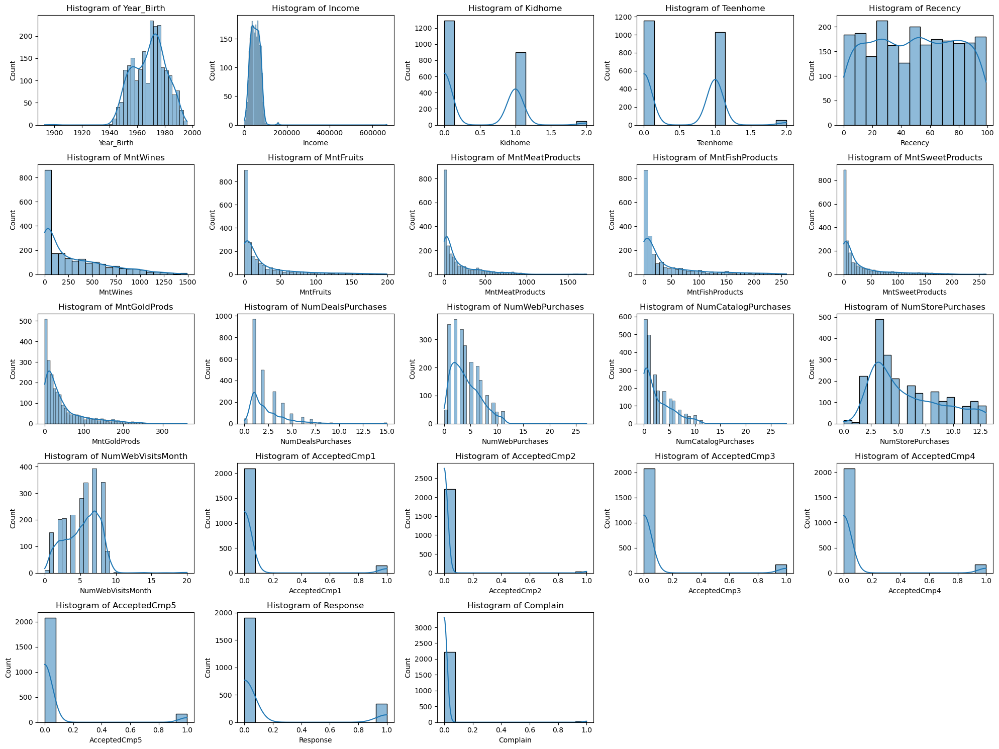

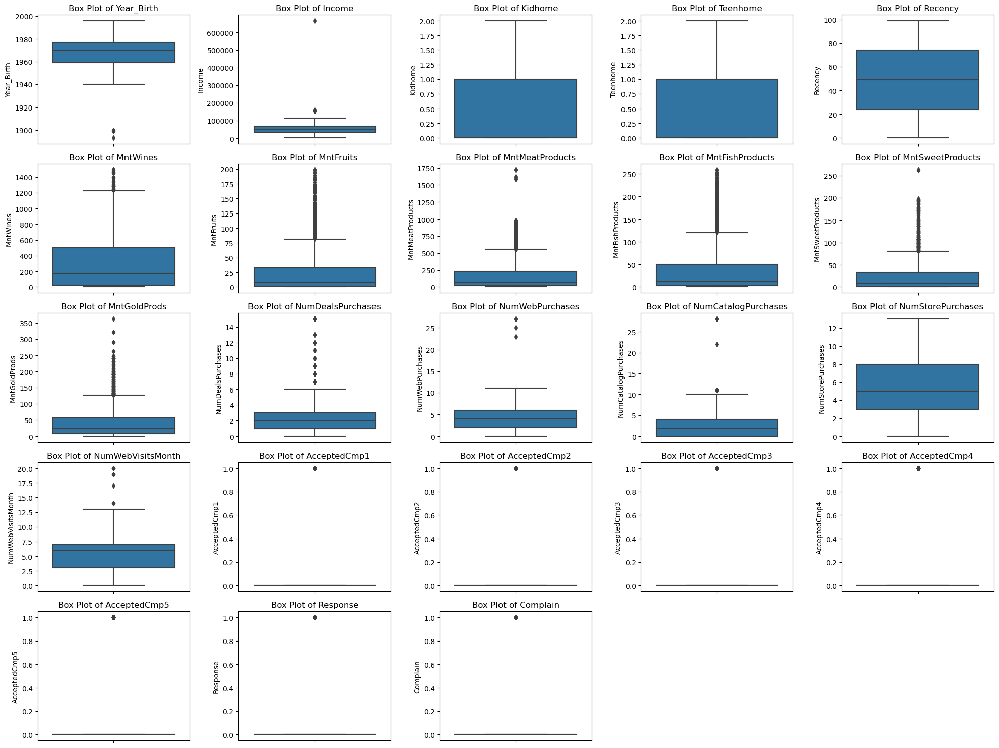

                     Missing Values (%)  Zero Values (%)          Mean  \
Year_Birth                          0.0         0.000000   1968.805804   
Income                              0.0         0.000000  52247.251354   
Kidhome                             0.0        57.723214      0.444196   
Teenhome                            0.0        51.696429      0.506250   
Recency                             0.0         1.250000     49.109375   
MntWines                            0.0         0.580357    303.935714   
MntFruits                           0.0        17.857143     26.302232   
MntMeatProducts                     0.0         0.044643    166.950000   
MntFishProducts                     0.0        17.142857     37.525446   
MntSweetProducts                    0.0        18.705357     27.062946   
MntGoldProds                        0.0         2.723214     44.021875   
NumDealsPurchases                   0.0         2.053571      2.325000   
NumWebPurchases                     0.

In [20]:
# Univariate Analysis for Continuous Variables
continuous_vars = sale.select_dtypes(include=[np.number]).columns.tolist()
continuous_vars.remove('ID')  # Exclude the 'ID' variable.

# Plot histograms for numerical variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(continuous_vars):
    plt.subplot(5, 5, i + 1)
    sns.histplot(sale[var], kde=True)
    plt.title(f'Histogram of {var}')

plt.tight_layout()
plt.show()

# Box plots for continuous variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(continuous_vars):
    plt.subplot(5, 5, i + 1)
    sns.boxplot(y=sale[var])
    plt.title(f'Box Plot of {var}')

plt.tight_layout()
plt.show()

# Initialize an empty dictionary to store results
data_quality_report = {}

# Calculate statistics for each continuous variable
for var in continuous_vars:
    data_quality_report[var] = {
        'Missing Values (%)': sale[var].isnull().mean() * 100,
        'Zero Values (%)': (sale[var] == 0).mean() * 100,
        'Mean': sale[var].mean(),
        '25th Percentile': sale[var].quantile(0.25),
        '50th Percentile (Median)': sale[var].median(),
        '75th Percentile': sale[var].quantile(0.75),
        '90th Percentile': sale[var].quantile(0.90),
        '95th Percentile': sale[var].quantile(0.95),
        'Min': sale[var].min(),
        'Max': sale[var].max()
    }

# Convert the dictionary to a DataFrame
data_quality_report_df = pd.DataFrame(data_quality_report).transpose()

# Display the data quality report
print(data_quality_report_df)

**Output:**

-  **Histograms:** Histograms for each numerical variable, showing the distribution and any skewness.
-  **Box Plots:** Box plots for each numerical variable, highlighting outliers.
-  **Data Quality Report:** Percentage of missing values, percentage of terms which are zero, mean, 25th, 50th, 75th, 90th and 95th percentile, min and max

**3. Create a data quality report after doing the necessary cleaning and joining of the files by:<br>
(b) Doing univariates for categorical variables (compute:percentage of missing values, number of unique values)**

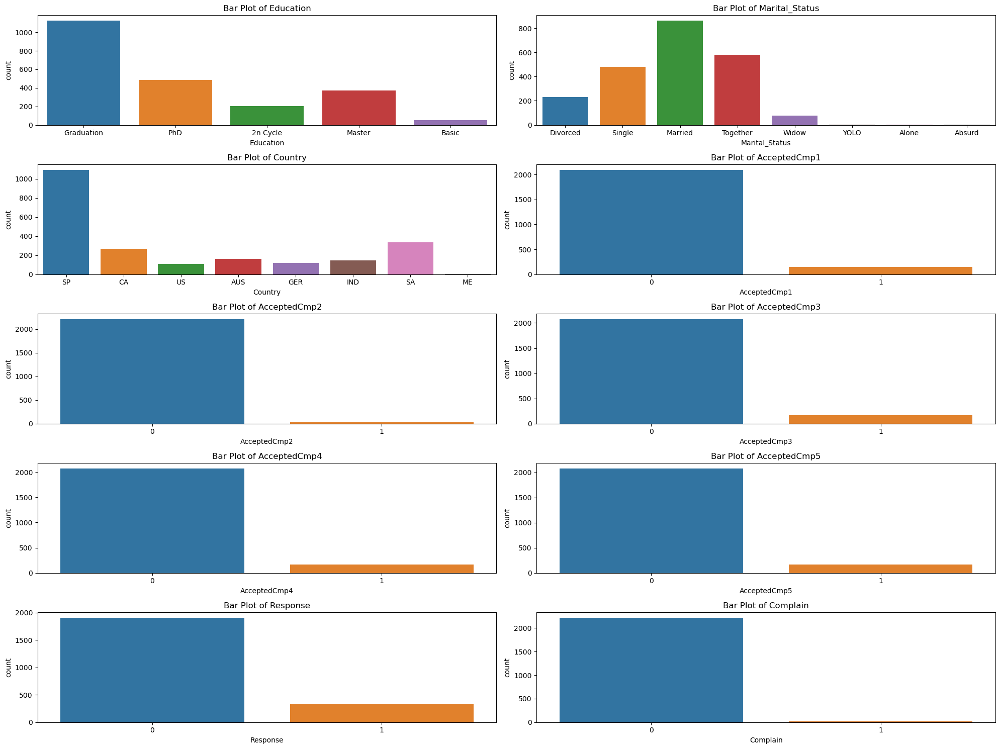

                Missing Values (%)  Unique Values
Education                      0.0            5.0
Marital_Status                 0.0            8.0
Country                        0.0            8.0
AcceptedCmp1                   0.0            2.0
AcceptedCmp2                   0.0            2.0
AcceptedCmp3                   0.0            2.0
AcceptedCmp4                   0.0            2.0
AcceptedCmp5                   0.0            2.0
Response                       0.0            2.0
Complain                       0.0            2.0


In [21]:
# Univariate Analysis for Categorical Variables

# List of categorical variables
categorical_vars = [
    'Education', 'Marital_Status', 'Country',
    'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
    'Response', 'Complain'
]

# Plot bar plots for categorical variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(categorical_vars):
    plt.subplot(5, 2, i + 1)
    sns.countplot(x=sale[var])
    plt.title(f'Bar Plot of {var}')

plt.tight_layout()
plt.show()

# Initialize an empty dictionary to store results
data_quality_report_categorical = {}

# Calculate statistics for each categorical variable
for var in categorical_vars:
    data_quality_report_categorical[var] = {
        'Missing Values (%)': sale[var].isnull().mean() * 100,
        'Unique Values': sale[var].nunique()
    }

# Convert the dictionary to a DataFrame
data_quality_report_categorical_df = pd.DataFrame(data_quality_report_categorical).transpose()

# Display the data quality report for categorical variables
print(data_quality_report_categorical_df)

# Bivariate Analysis

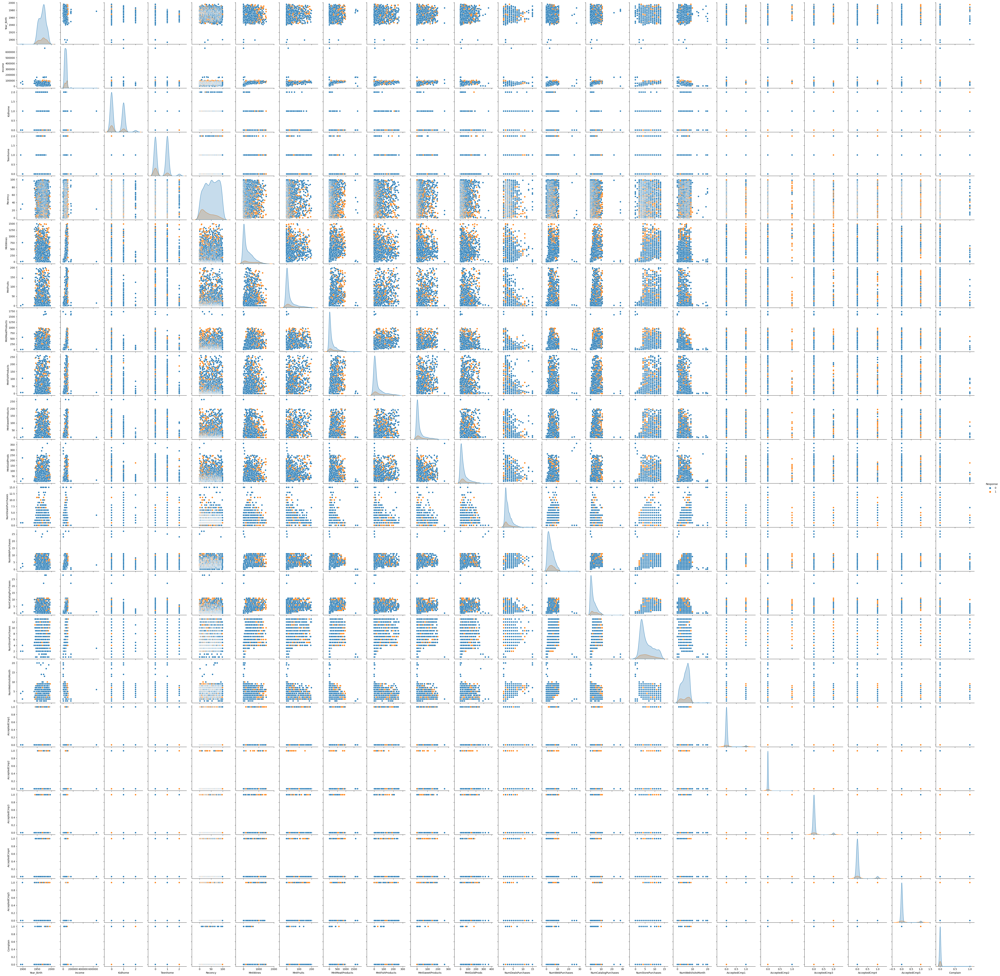

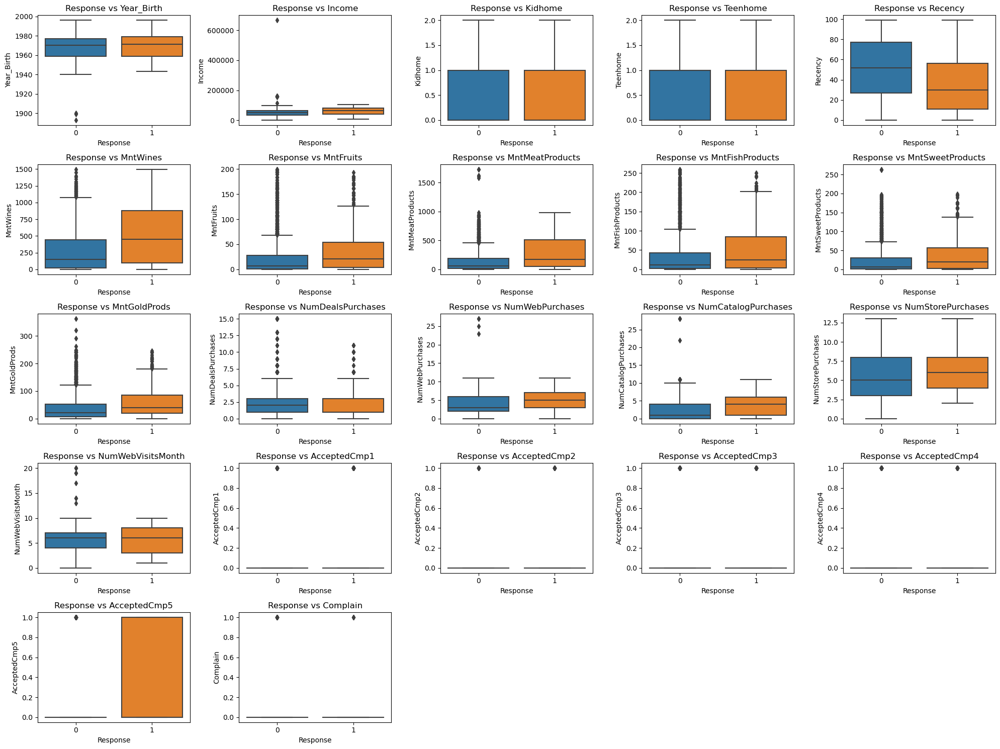

C:\Users\pc\AppData\Local\Temp\ipykernel_21288\2598913552.py:21: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = sale.corr()


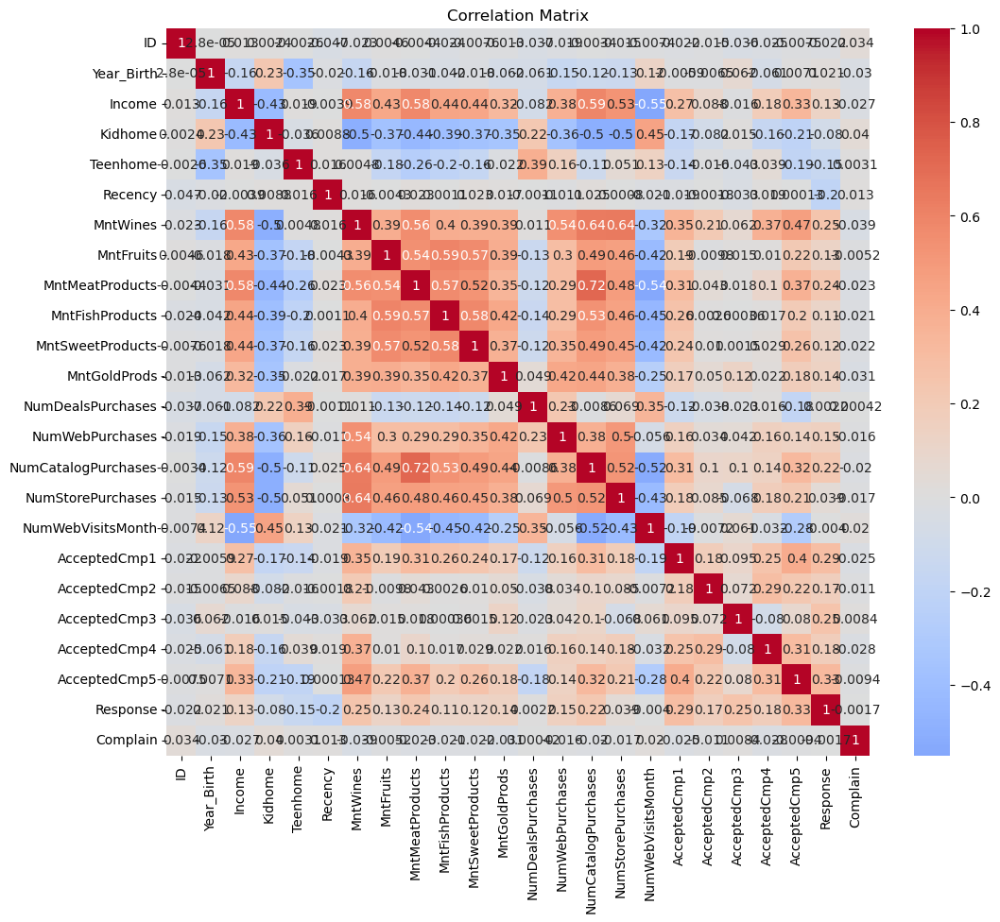

In [22]:
# Bivariate Analysis for Numerical Variables
numerical_vars = sale.select_dtypes(include=[np.number]).columns.tolist()
numerical_vars.remove('ID')  # Exclude the 'ID' variable.
numerical_vars.remove('Response')  # Exclude the target variable itself

# Plot pair plots
sns.pairplot(sale, hue='Response', vars=numerical_vars)
plt.show()

# Plot box plots to explore relationship between 'Response' and numerical variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(numerical_vars):
    plt.subplot(5, 5, i + 1)
    sns.boxplot(x='Response', y=var, data=sale)
    plt.title(f'Response vs {var}')

plt.tight_layout()
plt.show()

# Compute and plot the correlation matrix
corr_matrix = sale.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()

# Output:
-  **Pair Plots:** Visualize relationships between numerical variables and 'Response'.
-  **Box Plots:** Highlight differences in distributions of numerical variables based on 'Response'.
-  **Correlation Matrix:** Show the correlation coefficients between numerical variables and 'Response'.

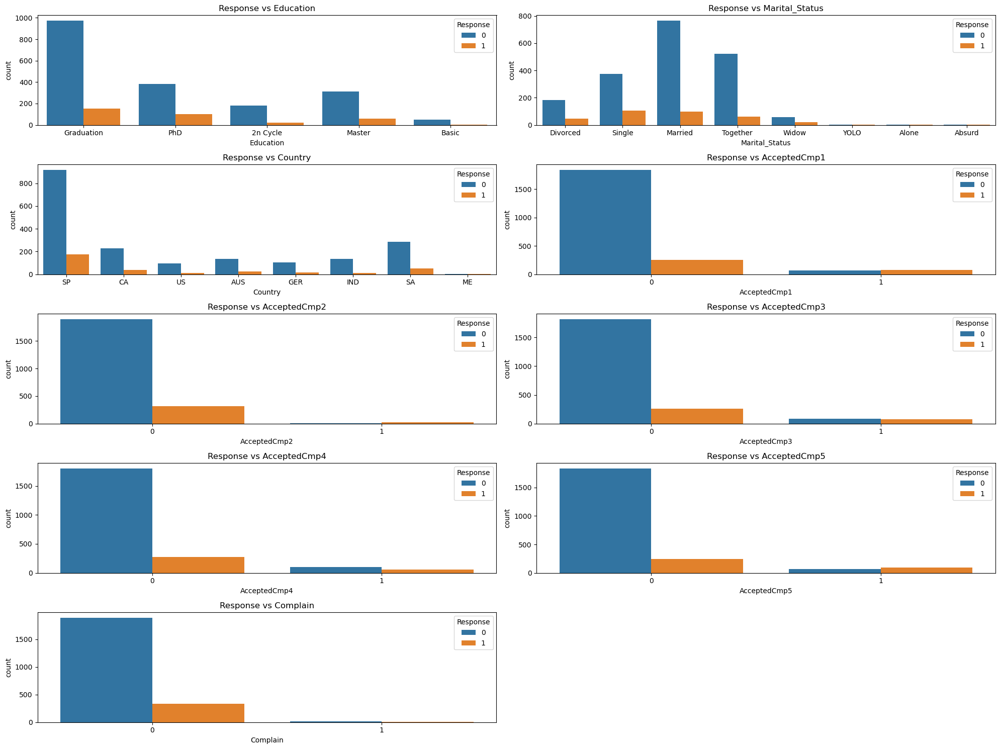

                     p-value
Education       1.222698e-04
Marital_Status  2.106747e-09
Country         7.415067e-02
AcceptedCmp1    2.815498e-43
AcceptedCmp2    8.878118e-15
AcceptedCmp3    9.364996e-33
AcceptedCmp4    1.395368e-16
AcceptedCmp5    3.828045e-53
Complain        1.000000e+00


In [23]:
# Bivariate Analysis for Categorical Variables
categorical_vars = [
    'Education', 'Marital_Status', 'Country',
    'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
    'Complain'
]

# Plot bar plots for categorical variables
plt.figure(figsize=(20, 15))
for i, var in enumerate(categorical_vars):
    plt.subplot(5, 2, i + 1)
    sns.countplot(x=var, hue='Response', data=sale)
    plt.title(f'Response vs {var}')

plt.tight_layout()
plt.show()

# Perform Chi-Square test for categorical variables
chi2_results = {}
for var in categorical_vars:
    contingency_table = pd.crosstab(sale[var], sale['Response'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    chi2_results[var] = p

# Display Chi-Square test results
chi2_results_df = pd.DataFrame.from_dict(chi2_results, orient='index', columns=['p-value'])
print(chi2_results_df)

# Output:
-  **Bar Plots:** Display the distribution of categorical variables based on 'Response'.
-  **Chi-Square Test Results:** Provide p-values indicating the significance of relationships between categorical variables and 'Response'.

# Feature Engineering

In [24]:
# Feature Engineering
# Extract year and month from Dt_Customer
sale['Customer_Year'] = sale['Dt_Customer'].dt.year
sale['Customer_Month'] = sale['Dt_Customer'].dt.month

# Calculate duration of customer relationship in years
sale['Customer_Years'] = 2024 - sale['Customer_Year']

# Create income categories
bins = [0, 30000, 60000, 90000, 120000]
labels = ['Low', 'Medium', 'High', 'Very High']
sale['Income_Category'] = pd.cut(sale['Income'], bins=bins, labels=labels, include_lowest=True)

# Calculate total spending
sale['Total_Spending'] = (sale['MntWines'] + sale['MntFruits'] + 
                               sale['MntMeatProducts'] + sale['MntFishProducts'] + 
                               sale['MntSweetProducts'] + sale['MntGoldProds'])

# Create adjusted family size based on marital status
def calculate_family_size(row):
    if row['Marital_Status'] in ['Married', 'Together']:
        return 2 + row['Kidhome'] + row['Teenhome']
    elif row['Marital_Status'] in ['Divorced', 'Widowed']:
        return 1 + row['Kidhome'] + row['Teenhome']
    else:  # Single
        return 1 + row['Kidhome'] + row['Teenhome']
    
sale['Family_Size'] = sale.apply(calculate_family_size, axis=1)

# Calculate average monthly purchases
sale['Avg_Monthly_Purchases'] = (sale['NumDealsPurchases'] + sale['NumWebPurchases'] + 
                                      sale['NumCatalogPurchases'] + sale['NumStorePurchases']) / 12

# Create ratio features
sale['Web_to_Total_Purchases'] = sale['NumWebPurchases'] / (sale['NumWebPurchases'] + 
                                                                      sale['NumCatalogPurchases'] + 
                                                                      sale['NumStorePurchases'])

# Display the first few rows of the engineered dataframe
print(sale.head())

      ID  Year_Birth   Education Marital_Status   Income  Kidhome  Teenhome  \
0   1826        1970  Graduation       Divorced  84835.0        0         0   
1      1        1961  Graduation         Single  57091.0        0         0   
2  10476        1958  Graduation        Married  67267.0        0         1   
3   1386        1967  Graduation       Together  32474.0        1         1   
4   5371        1989  Graduation         Single  21474.0        1         0   

  Dt_Customer Country  Recency  ...  Response  Complain  Customer_Year  \
0  2014-06-16      SP        0  ...         1         0           2014   
1  2014-06-15      CA        0  ...         1         0           2014   
2  2014-05-13      US        0  ...         0         0           2014   
3  2014-05-11     AUS        0  ...         0         0           2014   
4  2014-04-08      SP        0  ...         1         0           2014   

   Customer_Month  Customer_Years  Income_Category  Total_Spending  \
0         

# Explanation of Feature Engineering
**Handling Dates:**
-  Extract the year and month from Dt_Customer.
-  Calculate the duration of the customer relationship in years.

**Income Categories:**
-  Categorize income into bins: 'Low', 'Medium', 'High', and 'Very High'.

**Total Spending:**
-  Sum up the monetary values of different product categories to calculate total spending.

**Family Size:**
-  Incorporates the marital status into the calculation of family size.
-  **Single:** Assume a family size of 1 plus the number of kids and teens.
-  **Married / Together:** Assume a family size of 2 (including the spouse) plus the number of kids and teens.
-  **Divorced / Widowed:** Assume a family size of 1 (the individual) plus the number of kids and teens.

**Average Monthly Purchases:**
-  Calculate the average number of monthly purchases across different purchase channels.

**Ratio Features:**
-  Calculate the ratio of web purchases to total purchases.

**4. Are there any extreme values of variables representing income, amount of money spent on various categories, recency of purchase?**

In [25]:
# List of variables to check for extreme values
variables_of_interest = [
    'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'
]

# Function to identify outliers using IQR method
def find_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

# Identify and print outliers for each variable of interest
for var in variables_of_interest:
    outliers = find_outliers(sale, var)
    print(f"Outliers for {var}:")
    print(outliers)
    print()

Outliers for Income:
         ID  Year_Birth   Education Marital_Status    Income  Kidhome  \
325    4931        1977  Graduation       Together  157146.0        0   
497    1501        1982         PhD        Married  160803.0        0   
527    9432        1977  Graduation       Together  666666.0        1   
731    1503        1976         PhD       Together  162397.0        1   
853    5336        1971      Master       Together  157733.0        1   
1826   5555        1975  Graduation       Divorced  153924.0        0   
1925  11181        1949         PhD        Married  156924.0        0   
2204   8475        1973         PhD        Married  157243.0        0   

      Teenhome Dt_Customer Country  Recency  ...  Response  Complain  \
325          0  2013-04-29      SA       13  ...         0         0   
497          0  2012-08-04      US       21  ...         0         0   
527          0  2013-06-02      SA       23  ...         0         0   
731          1  2013-06-03      S

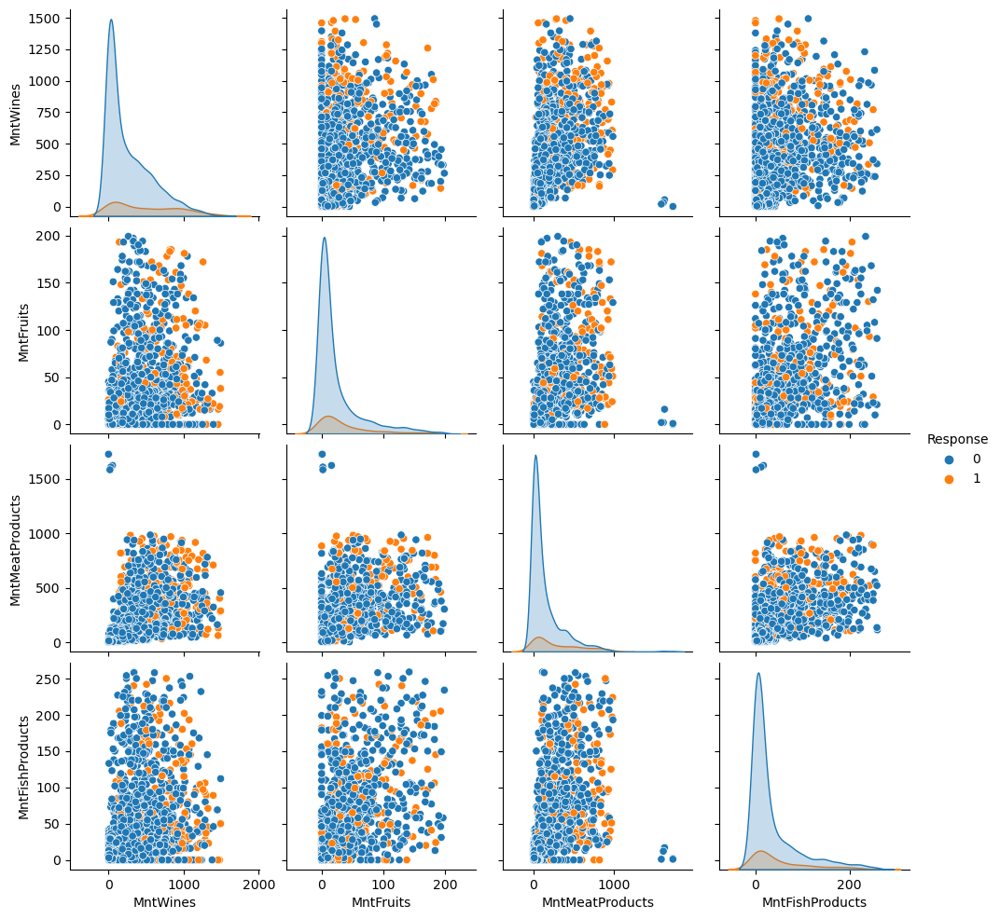

In [26]:
# Multivariate Analysis

purchase_columns_1 = [
    'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'Response'
]

# Create a new DataFrame with the selected columns
purchase_df = sale[purchase_columns_1]

# Visualize the pair plot
sns.pairplot(purchase_df, hue='Response')
plt.show()

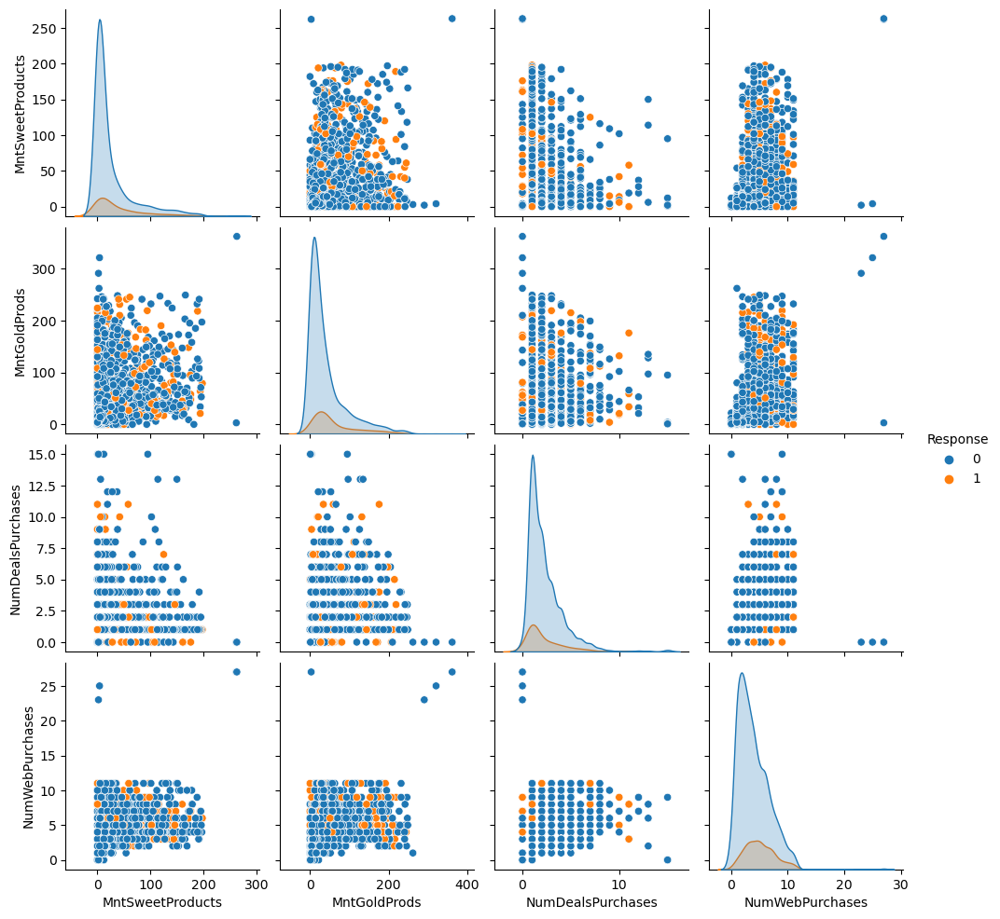

In [27]:
# Multivariate Analysis

purchase_columns_2 = [
    'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
    'NumWebPurchases', 'Response'
]

# Create a new DataFrame with the selected columns
purchase_2_df = sale[purchase_columns_2]

# Visualize the pair plot
sns.pairplot(purchase_2_df, hue='Response')
plt.show()

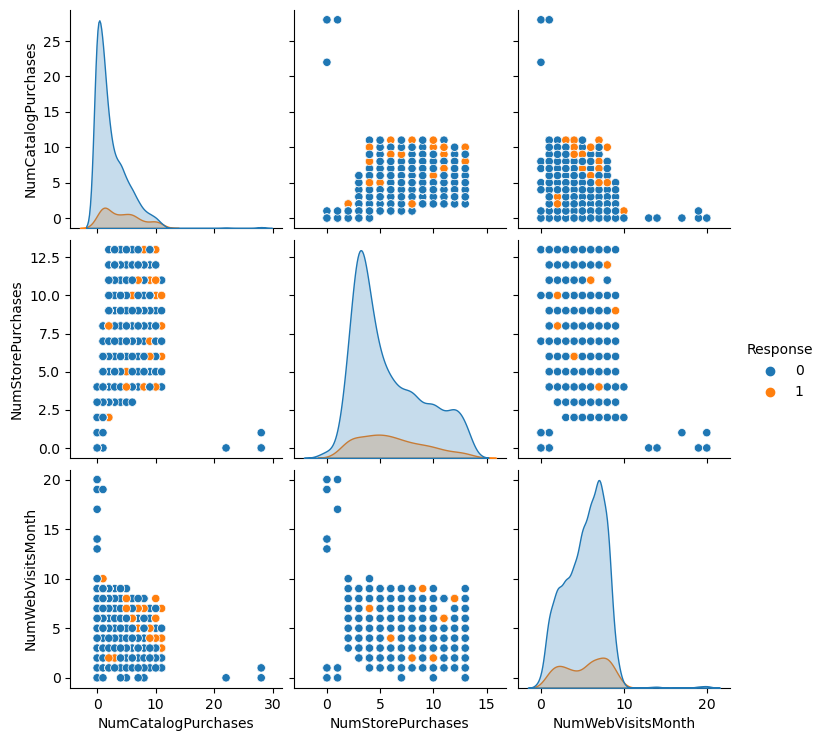

In [28]:
# Multivariate Analysis

purchase_columns_3 = [
    'NumCatalogPurchases', 'NumStorePurchases',
    'NumWebVisitsMonth', 'Response'
]

# Create a new DataFrame with the selected columns
purchase_3_df = sale[purchase_columns_3]

# Visualize the pair plot
sns.pairplot(purchase_3_df, hue='Response')
plt.show()

# Business Analysis and Hypothesis (Task 2)
**1. Generate and check hypothesis around Amount Spent on different categories and response rate in different marketing campaigns.**

In [29]:
'''
Descriptive Statistics:
Let's calculate the mean and standard deviation of amounts spent in different categories for responders and non-responders.
'''

# Separate responders and non-responders
responders = sale[sale['Response'] == 1]
non_responders = sale[sale['Response'] == 0]

# Calculate descriptive statistics
categories = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
desc_stats_list = []

for category in categories:
    responder_mean = responders[category].mean()
    responder_sd = responders[category].std()
    non_responder_mean = non_responders[category].mean()
    non_responder_sd = non_responders[category].std()
    desc_stats_list.append({
        'Category': category,
        'Responder_Mean': responder_mean,
        'Responder_SD': responder_sd,
        'Non_Responder_Mean': non_responder_mean,
        'Non_Responder_SD': non_responder_sd
    })

desc_stats = pd.DataFrame(desc_stats_list)
print(desc_stats)
print("\n")

# T-tests
t_test_results_list = []

for category in categories:
    t_stat, p_value = stats.ttest_ind(responders[category], non_responders[category], equal_var=False)
    t_test_results_list.append({
        'Category': category,
        'T-Statistic': t_stat,
        'P-Value': p_value
    })

t_test_results = pd.DataFrame(t_test_results_list)
print("T-tests results")
print(t_test_results)

# Chi-Square Test for Campaign Responses

campaigns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']

# Create a contingency table
contingency_table = pd.DataFrame()

for campaign in campaigns:
    contingency_table[campaign] = sale[campaign]
contingency_table['Response'] = sale['Response']

# Filter out rows and columns with all zeros
contingency_table = contingency_table.loc[:, (contingency_table != 0).any(axis=0)]
contingency_table = contingency_table[(contingency_table.T != 0).any()]

# Perform Chi-Square test
chi2, p, dof, ex = stats.chi2_contingency(contingency_table)

print("\n")
print(f'Chi-Square Statistic: {chi2}, P-Value: {p}')

           Category  Responder_Mean  Responder_SD  Non_Responder_Mean  \
0          MntWines      502.703593    427.183786          269.104407   
1         MntFruits       38.203593     46.099519           24.216684   
2   MntMeatProducts      294.353293    286.890036          144.624344   
3   MntFishProducts       52.050898     61.855885           34.980063   
4  MntSweetProducts       38.634731     46.327903           25.035152   
5      MntGoldProds       61.446108     57.507501           40.968520   

   Non_Responder_SD  
0        305.159188  
1         38.191763  
2        205.299936  
3         52.870253  
4         40.001067  
5         50.576032  


T-tests results
           Category  T-Statistic       P-Value
0          MntWines     9.574842  1.149555e-19
1         MntFruits     5.238857  2.570387e-07
2   MntMeatProducts     9.136982  3.403470e-18
3   MntFishProducts     4.748847  2.806608e-06
4  MntSweetProducts     5.045376  6.723891e-07
5      MntGoldProds     6.106980  

**Explanation**

**Descriptive Statistics and T-tests:**

-  Calculate the mean and standard deviation for responders and non-responders for each spending category.
-  Perform t-tests to compare the means of amounts spent between responders and non-responders.

**Chi-Square Test:**

-  Construct a contingency table that includes only the columns and rows with non-zero values.
-  Perform a chi-square test to compare response rates across different campaigns.

**Results Interpretation**
-  **Descriptive Statistics:** Helps understand the spending patterns of responders and non-responders.
-  **T-tests:** A low p-value indicates a significant difference in spending between responders and non-responders.
-  **Chi-Square Test:** A low p-value indicates a significant difference in response rates across different campaigns.

**2. Create a funnel analysis showing what percentage of unique customers accept campaign 1,2, 3,..etc**

**Steps for Funnel Analysis**
-  Load the Data: Ensure the data is in the correct format.
-  Calculate Acceptance Rates: Determine the number and percentage of customers who accepted each campaign.
-  Visualize the Funnel: Create a visualization to represent the funnel analysis.

     Campaign  Accepted  Percentage
0  Campaign 1       144    6.428571
1  Campaign 2        30    1.339286
2  Campaign 3       163    7.276786
3  Campaign 4       167    7.455357
4  Campaign 5       163    7.276786


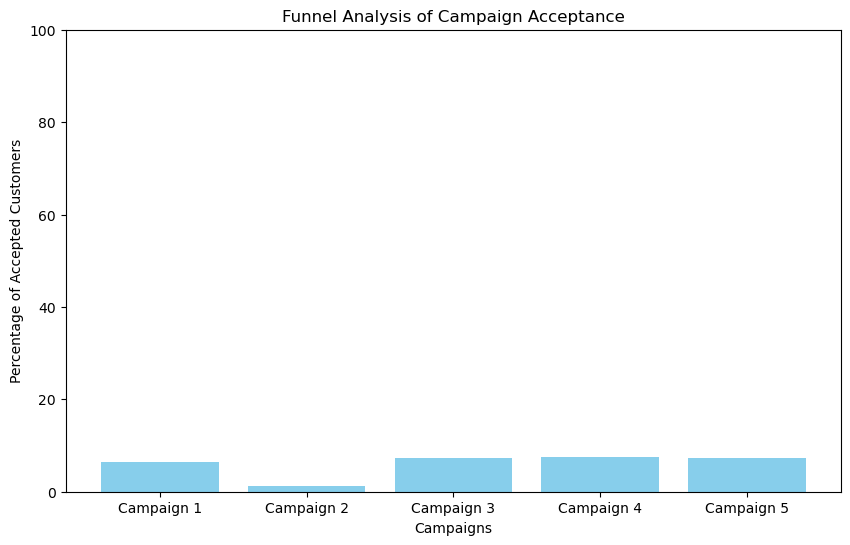

In [30]:
# Calculate the number of unique customers who accepted each campaign
total_customers = len(sale)
accepted_cmp1 = sale['AcceptedCmp1'].sum()
accepted_cmp2 = sale['AcceptedCmp2'].sum()
accepted_cmp3 = sale['AcceptedCmp3'].sum()
accepted_cmp4 = sale['AcceptedCmp4'].sum()
accepted_cmp5 = sale['AcceptedCmp5'].sum()

# Calculate the percentage of unique customers who accepted each campaign
percent_cmp1 = (accepted_cmp1 / total_customers) * 100
percent_cmp2 = (accepted_cmp2 / total_customers) * 100
percent_cmp3 = (accepted_cmp3 / total_customers) * 100
percent_cmp4 = (accepted_cmp4 / total_customers) * 100
percent_cmp5 = (accepted_cmp5 / total_customers) * 100

# Create a DataFrame for the funnel analysis
funnel_data = {
    'Campaign': ['Campaign 1', 'Campaign 2', 'Campaign 3', 'Campaign 4', 'Campaign 5'],
    'Accepted': [accepted_cmp1, accepted_cmp2, accepted_cmp3, accepted_cmp4, accepted_cmp5],
    'Percentage': [percent_cmp1, percent_cmp2, percent_cmp3, percent_cmp4, percent_cmp5]
}

funnel_df = pd.DataFrame(funnel_data)

print(funnel_df)

# Visualize the funnel analysis
plt.figure(figsize=(10, 6))
plt.bar(funnel_df['Campaign'], funnel_df['Percentage'], color='skyblue')
plt.xlabel('Campaigns')
plt.ylabel('Percentage of Accepted Customers')
plt.title('Funnel Analysis of Campaign Acceptance')
plt.ylim(0, 100)
plt.show()

**3. Find out how income impacts the amount spent on - Wine - Meat Products - Gold Products - Fish Products**

**Steps taken:**
-  **Correlation Analysis:** Calculate the correlation between income and the amounts spent on the specified products.
-  **Scatter Plots:** Visualize the relationship between income and the amounts spent using scatter plots.
-  **Regression Analysis:** Fit a linear regression model to understand the strength and nature of the relationship.

Correlation Matrix:
                   Income  MntWines  MntMeatProducts  MntGoldProds  \
Income           1.000000  0.576789         0.577802      0.321978   
MntWines         0.576789  1.000000         0.562667      0.387516   
MntMeatProducts  0.577802  0.562667         1.000000      0.350609   
MntGoldProds     0.321978  0.387516         0.350609      1.000000   
MntFishProducts  0.437497  0.399753         0.568402      0.422875   

                 MntFishProducts  
Income                  0.437497  
MntWines                0.399753  
MntMeatProducts         0.568402  
MntGoldProds            0.422875  
MntFishProducts         1.000000  


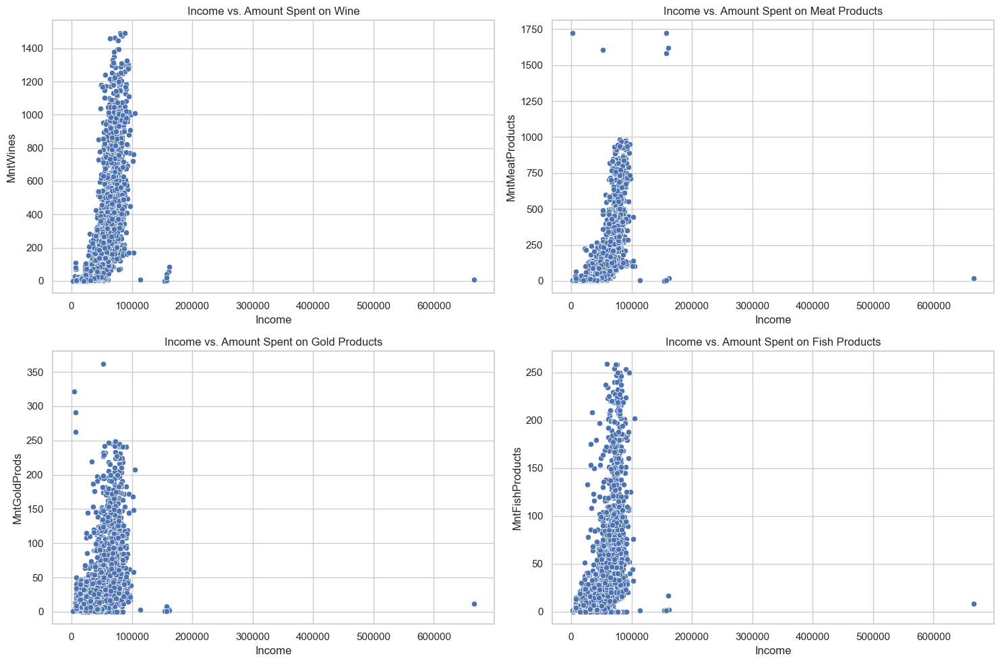


Regression Analysis for Income vs. MntWines:
                            OLS Regression Results                            
Dep. Variable:               MntWines   R-squared:                       0.333
Model:                            OLS   Adj. R-squared:                  0.332
Method:                 Least Squares   F-statistic:                     1116.
Date:                Wed, 19 Jun 2024   Prob (F-statistic):          7.78e-199
Time:                        15:29:25   Log-Likelihood:                -15759.
No. Observations:                2240   AIC:                         3.152e+04
Df Residuals:                    2238   BIC:                         3.153e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const 

In [31]:
import statsmodels.api as sm

# Correlation Analysis
correlation_matrix = sale[['Income', 'MntWines', 'MntMeatProducts', 'MntGoldProds', 'MntFishProducts']].corr()
print("Correlation Matrix:")
print(correlation_matrix)

# Scatter Plots
sns.set(style="whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.scatterplot(ax=axes[0, 0], x='Income', y='MntWines', data=sale)
axes[0, 0].set_title('Income vs. Amount Spent on Wine')

sns.scatterplot(ax=axes[0, 1], x='Income', y='MntMeatProducts', data=sale)
axes[0, 1].set_title('Income vs. Amount Spent on Meat Products')

sns.scatterplot(ax=axes[1, 0], x='Income', y='MntGoldProds', data=sale)
axes[1, 0].set_title('Income vs. Amount Spent on Gold Products')

sns.scatterplot(ax=axes[1, 1], x='Income', y='MntFishProducts', data=sale)
axes[1, 1].set_title('Income vs. Amount Spent on Fish Products')

plt.tight_layout()
plt.show()

# Regression Analysis
def perform_regression(y_var):
    X = sale[['Income']]
    y = sale[y_var]
    X = sm.add_constant(X)  # Adding a constant term to the predictor

    model = sm.OLS(y, X).fit()
    predictions = model.predict(X)

    print(f"\nRegression Analysis for Income vs. {y_var}:")
    print(model.summary())

# Performing regression for each product category
product_categories = ['MntWines', 'MntMeatProducts', 'MntGoldProds', 'MntFishProducts']
for category in product_categories:
    perform_regression(category)

**Explanation**

-  **Correlation Analysis:** We calculate the correlation matrix to understand the linear relationship between income and the amount spent on each product category.
-  **Scatter Plots:** Scatter plots help visualize the relationship between income and the amount spent. Each plot will show if there is a trend or pattern in the data.
-  **Regression Analysis:** A linear regression model is fitted for each product category against income to quantify the relationship. The summary of the regression model provides coefficients, R-squared values, and p-values to evaluate the significance of the relationship.

**Output**
-  **Correlation Matrix:** Shows the correlation coefficients between income and the amounts spent on the product categories.
-  **Scatter Plots:** Visual representation of the relationship.
-  **Regression Analysis:** Detailed summary of the linear regression model for each product category.

**Interpretation**
-  **Correlation Coefficient:** Values close to 1 or -1 indicate a strong relationship, while values close to 0 indicate a weak relationship.
-  **Scatter Plots:** Help visually assess the relationship.
-  **Regression Summary:** The coefficients tell us how much the dependent variable (amount spent) is expected to change with a one-unit change in the independent variable (income). The p-value indicates if the relationship is statistically significant.

**4. Can you test the hypothesis that recent customers complain less in general compared to older customers?**

To test the hypothesis that recent customers complain less in general compared to older customers, we need to follow these steps:

**1. Define the Hypothesis:**
-  **Null Hypothesis (H0):** There is no difference in the complaint rates between recent and older customers.
-  **Alernative Hypothesis (H1):** Recent customers complain less compared to older customers.

**2. Define Recent and Older Customers:**
-  We can categorize customers based on the Dt_Customer field to define "recent" and "older" customers. For simplicity, we can consider customers who joined in the last year as "recent" and the rest as "older."

**3. Calculate Complaint Rates:**
-  Calculate the proportion of complaints for recent and older customers.

**4. Perform a Statistical Test:**
-  Use a statistical test, such as the Chi-Square test, to compare the proportions.

In [32]:
# Define recent and older customers
recent_cutoff_date = pd.to_datetime('2014-01-01')
sale['Customer_Type'] = np.where(sale['Dt_Customer'] >= recent_cutoff_date, 'Recent', 'Older')

# Calculate complaint rates
complaint_rates = sale.groupby('Customer_Type')['Complain'].mean()
print("Complaint Rates:")
print(complaint_rates)

# Perform Chi-Square Test
# Create a contingency table
contingency_table = pd.crosstab(sale['Customer_Type'], sale['Complain'])

# Perform the Chi-Square test
chi2, p, dof, ex = stats.chi2_contingency(contingency_table)

print(f"\nChi-Square Statistic: {chi2}, P-Value: {p}")

# Interpret the result
alpha = 0.05
if p < alpha:
    print("Reject the null hypothesis: Recent customers complain less compared to older customers.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in complaint rates between recent and older customers.")

Complaint Rates:
Customer_Type
Older     0.010695
Recent    0.005386
Name: Complain, dtype: float64

Chi-Square Statistic: 0.7628363648756273, P-Value: 0.3824423445637971
Fail to reject the null hypothesis: There is no significant difference in complaint rates between recent and older customers.


**Explanation**

**1. Data Preparation:**
-  Define the recent_cutoff_date as a pd.Timestamp.
-  Use np.where to create a new column Customer_Type to categorize customers based on the cutoff date.

**2. Complaint Rate Calculation:**
-  Group by Customer_Type and calculate the mean of the Complain column.

**3. Chi-Square Test:**
-  Create a contingency table with the customer type and complaints.
-  Perform the Chi-Square test to compare the complaint rates.

**4. Result Interpretation:**
-  If the p-value is less than the significance level (0.05), reject the null hypothesis, indicating that recent customers complain less.
-  Otherwise, fail to reject the null hypothesis, indicating no significant difference.

**Output**
-  **Complaint Rates:** Shows the proportion of complaints for recent and older customers.
-  **Chi-Square Statistic and P-Value:** Results of the Chi-Square test to determine if there is a significant difference in complaint rates.

**5. Do people who accept the offer in the first campaign also accept in any other campaign?**

To determine if people who accept the offer in the first campaign also accept offers in any other campaign, we need to:

-  Identify the customers who accepted the first campaign.
-  Check if these customers also accepted offers in any other campaign.

We can do this using the campaign data. We'll follow these steps:

-  Filter the customers who accepted the first campaign (AcceptedCmp1).
-  Check if these customers accepted any other campaigns (AcceptedCmp2, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5).
-  Calculate the proportion of customers who accepted the first campaign and also accepted each of the other campaigns.

In [35]:
# Filtering the customers who accepted the first campaign
accepted_cmp1 = sale[sale['AcceptedCmp1'] == 1].copy()

# Checking if these customers also accepted any other campaigns
accepted_cmp1.loc[:, 'AcceptedOther'] = accepted_cmp1[['AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']].any(axis=1)

# Calculating the proportion of customers who accepted the first campaign and also accepted each of the other campaigns
proportion_cmp2 = accepted_cmp1['AcceptedCmp2'].mean()
proportion_cmp3 = accepted_cmp1['AcceptedCmp3'].mean()
proportion_cmp4 = accepted_cmp1['AcceptedCmp4'].mean()
proportion_cmp5 = accepted_cmp1['AcceptedCmp5'].mean()
proportion_any_other = accepted_cmp1['AcceptedOther'].mean()

print(f"Proportion of customers who accepted the first campaign and also accepted the second campaign: {proportion_cmp2:.2f}")
print(f"Proportion of customers who accepted the first campaign and also accepted the third campaign: {proportion_cmp3:.2f}")
print(f"Proportion of customers who accepted the first campaign and also accepted the fourth campaign: {proportion_cmp4:.2f}")
print(f"Proportion of customers who accepted the first campaign and also accepted the fifth campaign: {proportion_cmp5:.2f}")
print(f"Proportion of customers who accepted the first campaign and also accepted any other campaign: {proportion_any_other:.2f}")

Proportion of customers who accepted the first campaign and also accepted the second campaign: 0.09
Proportion of customers who accepted the first campaign and also accepted the third campaign: 0.17
Proportion of customers who accepted the first campaign and also accepted the fourth campaign: 0.33
Proportion of customers who accepted the first campaign and also accepted the fifth campaign: 0.47
Proportion of customers who accepted the first campaign and also accepted any other campaign: 0.64


**Output**

**Proportion of Customers:** 
-  The output is showing the proportion of customers who accepted the first campaign and also accepted each of the other campaigns.
-  Additionally, it also shows the proportion of customers who accepted the first campaign and also accepted any other campaign.

**6. Profile of people who respond vs. who don’t.**

**Steps:**
-  Separate the data into responders and non-responders.
-  Compare key demographic and behavioral features between the two groups.
-  Use visualizations to illustrate the differences.

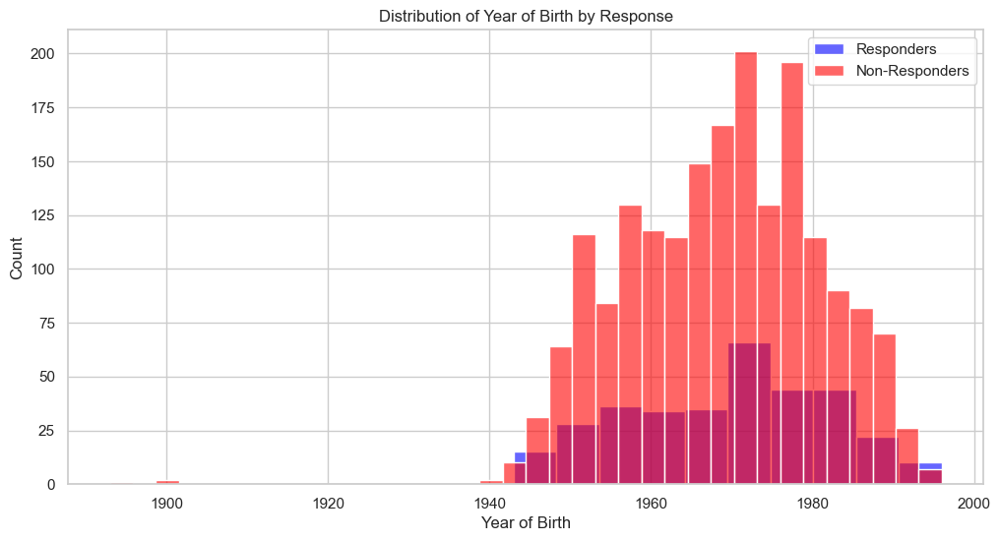

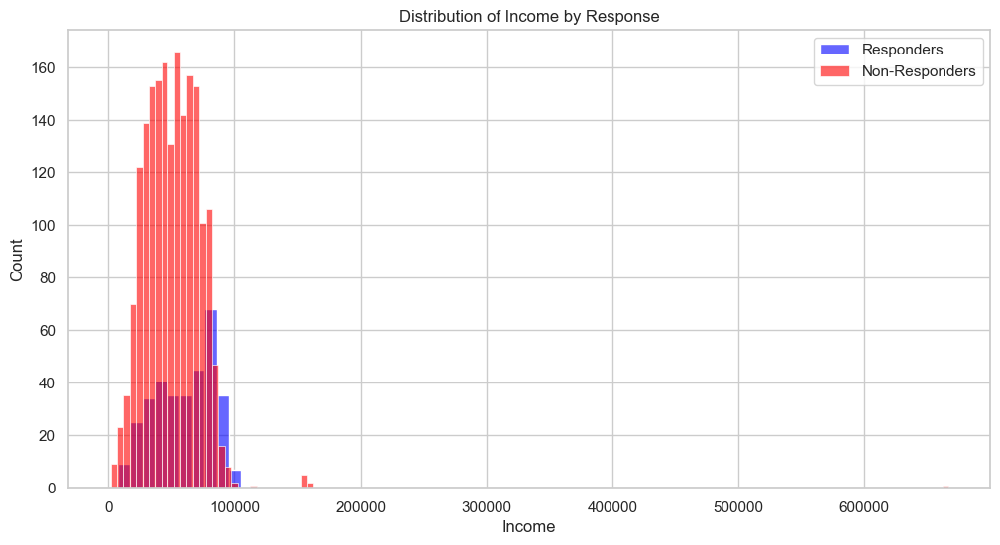

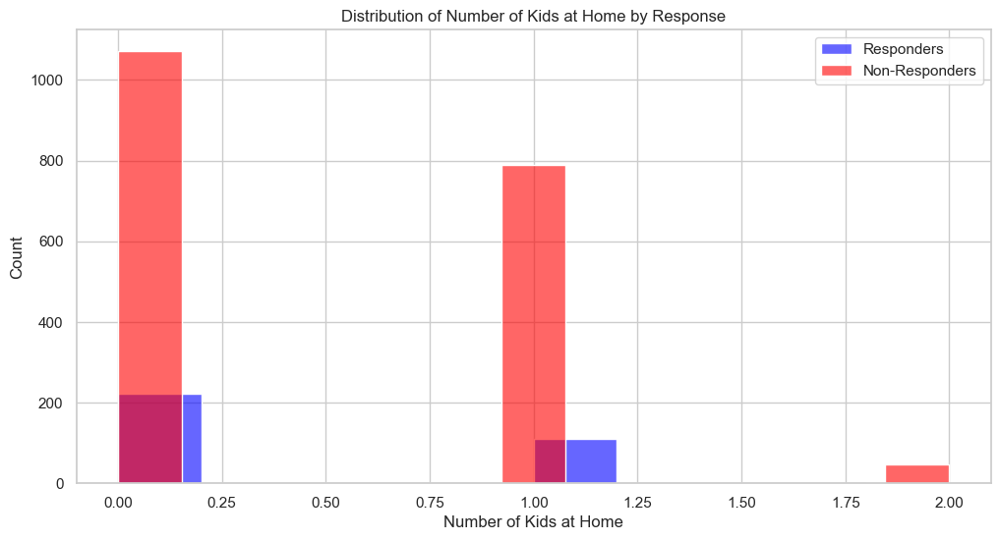

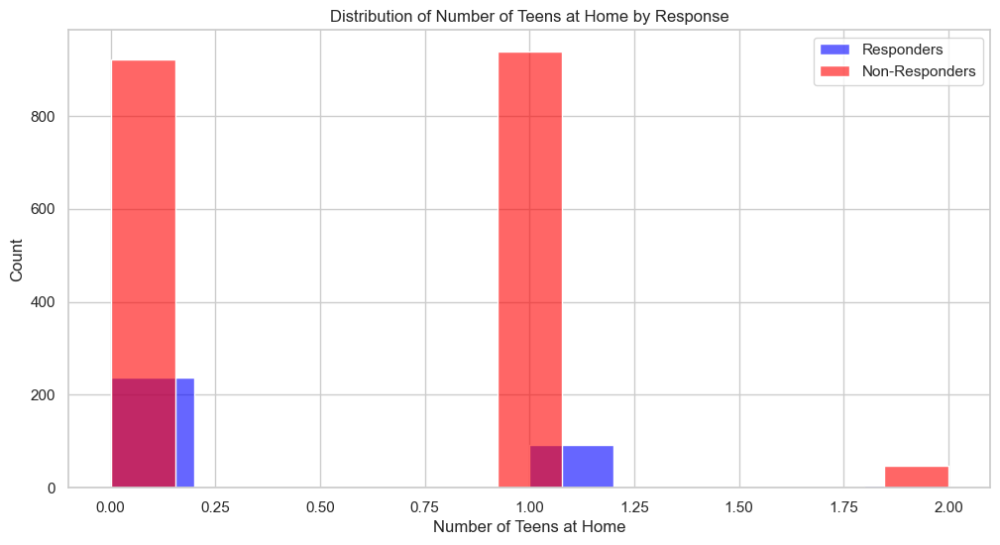

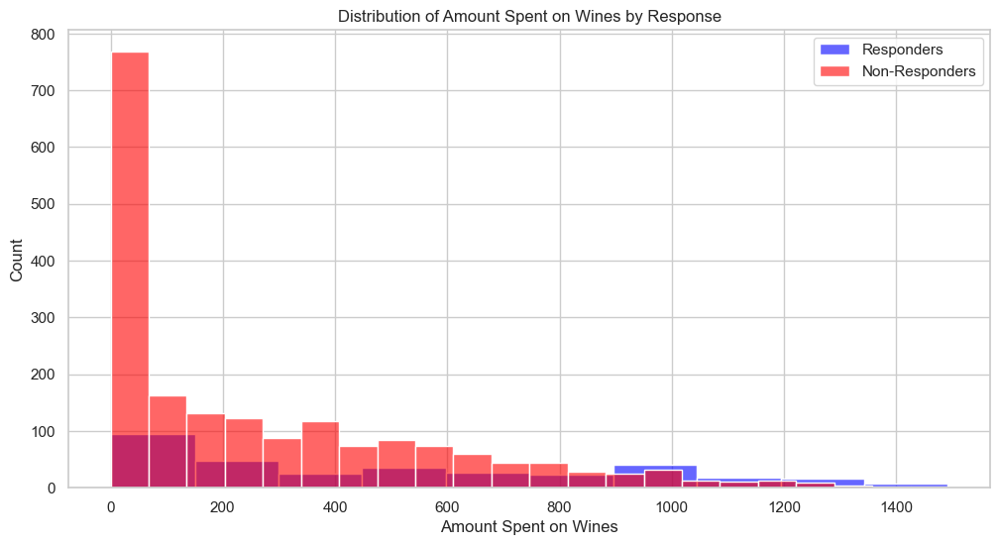

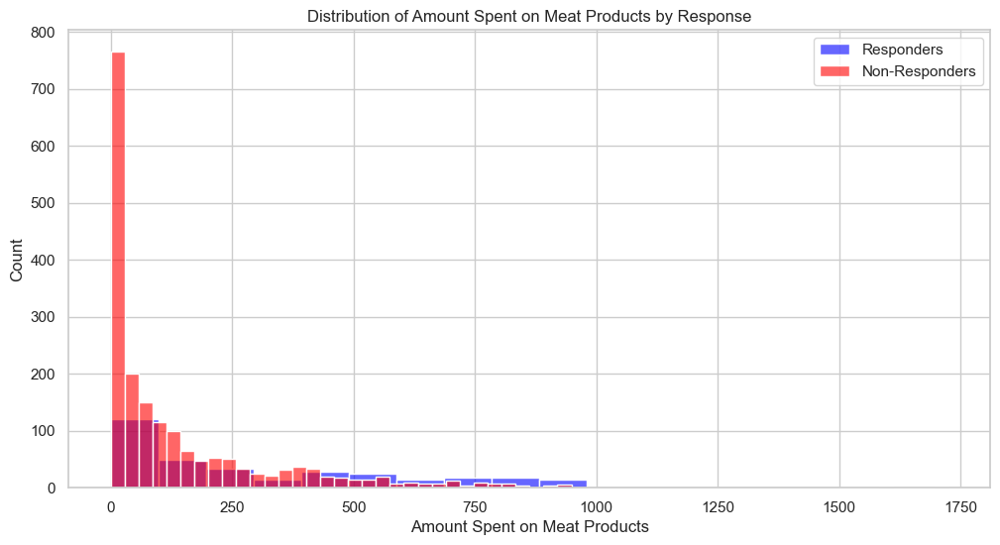

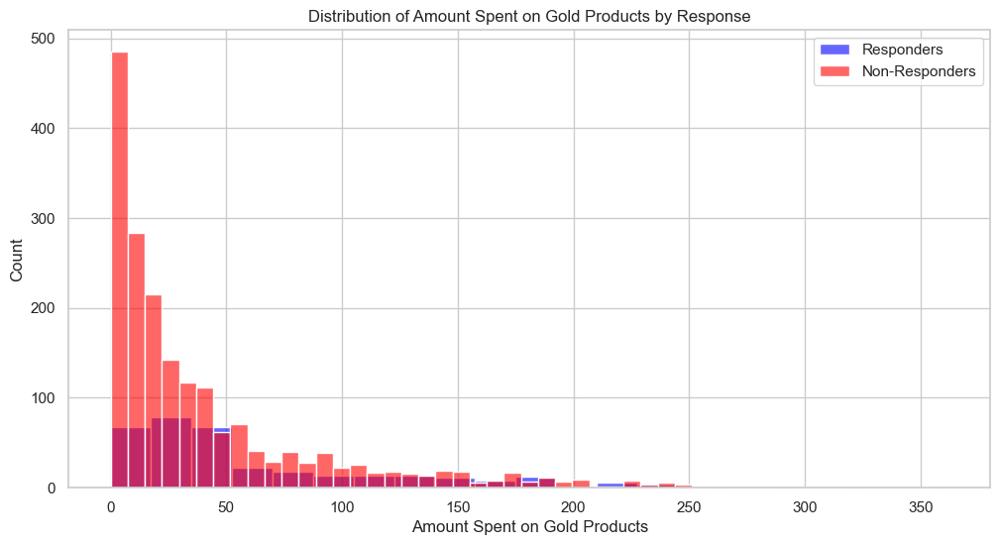

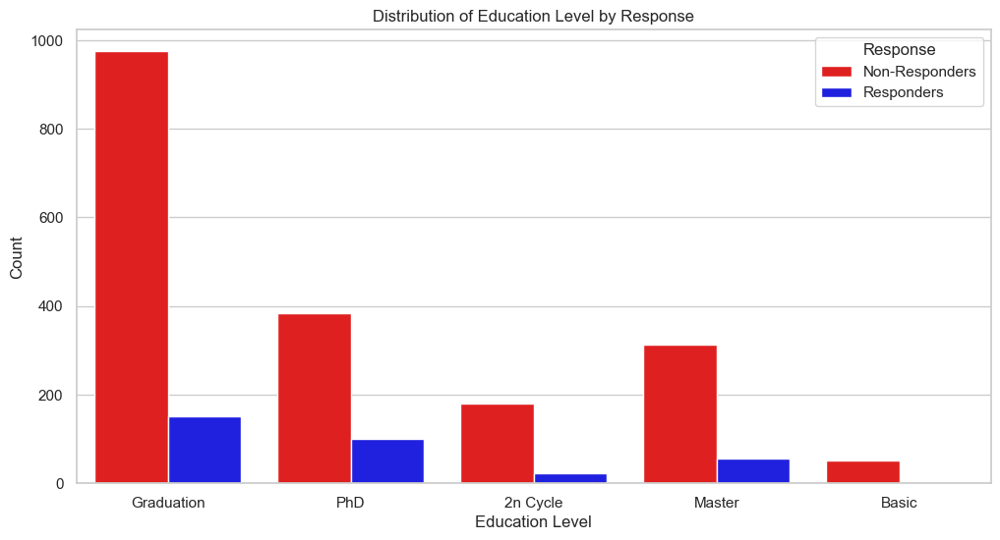

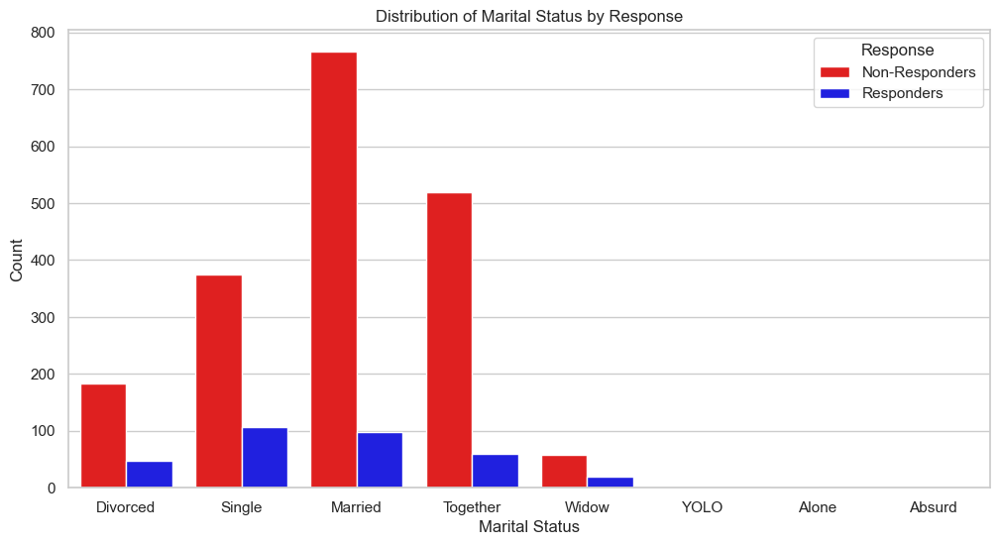

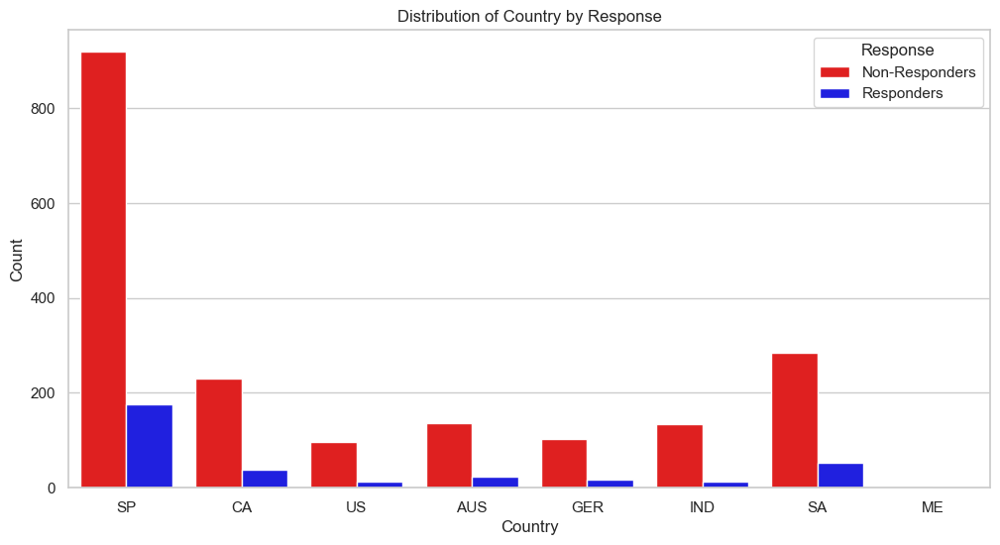

In [36]:
# Separating the data into responders and non-responders
responders = sale[sale['Response'] == 1]
non_responders = sale[sale['Response'] == 0]

# Comparing key demographic and behavioral features
def compare_feature(feature, title):
    plt.figure(figsize=(12, 6))
    sns.histplot(responders[feature], kde=False, color='blue', label='Responders', alpha=0.6)
    sns.histplot(non_responders[feature], kde=False, color='red', label='Non-Responders', alpha=0.6)
    plt.title(f'Distribution of {title} by Response')
    plt.xlabel(title)
    plt.ylabel('Count')
    plt.legend()
    plt.show()

# Visualizing the comparisons for key features
compare_feature('Year_Birth', 'Year of Birth')
compare_feature('Income', 'Income')
compare_feature('Kidhome', 'Number of Kids at Home')
compare_feature('Teenhome', 'Number of Teens at Home')
compare_feature('MntWines', 'Amount Spent on Wines')
compare_feature('MntMeatProducts', 'Amount Spent on Meat Products')
compare_feature('MntGoldProds', 'Amount Spent on Gold Products')

# Categorical variable comparison
def compare_categorical(feature, title):
    plt.figure(figsize=(12, 6))
    sns.countplot(x=feature, hue='Response', data=sale, palette=['red', 'blue'])
    plt.title(f'Distribution of {title} by Response')
    plt.xlabel(title)
    plt.ylabel('Count')
    plt.legend(title='Response', labels=['Non-Responders', 'Responders'])
    plt.show()

# Visualize comparisons for key categorical features
compare_categorical('Education', 'Education Level')
compare_categorical('Marital_Status', 'Marital Status')
compare_categorical('Country', 'Country')

**Output**<br>
**Visual Comparisons:**
-  Histograms and count plots showing the distribution of key features for responders and non-responders.
-  These visualizations help identify patterns and differences between the two groups.

In [40]:
print(sale.columns)

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Country', 'Recency', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4',
       'AcceptedCmp5', 'Response', 'Complain', 'Customer_Year',
       'Customer_Month', 'Customer_Years', 'Income_Category', 'Total_Spending',
       'Family_Size', 'Avg_Monthly_Purchases', 'Web_to_Total_Purchases',
       'Customer_Type'],
      dtype='object')


In [43]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# Defining features and target
X = sale.drop(columns=['ID', 'Dt_Customer', 'Response'])
y = sale['Response']

# Preprocessing the data
numeric_features = ['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
                    'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
                    'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']
categorical_features = ['Education', 'Marital_Status', 'Income_Category', 'Country']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(), categorical_features)
    ])

# Defining models
models = {
    'Logistic Regression': LogisticRegression(max_iter=2000),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier()
}

# Training and evaluating models
for name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier', model)])
    # Spliting the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    # Fitting model
    pipeline.fit(X_train, y_train)
    
    # Prediction
    y_pred = pipeline.predict(X_test)
    
    # Evaluation
    print(f'--- {name} ---')
    print(classification_report(y_test, y_pred))
    print(f'ROC AUC Score: {roc_auc_score(y_test, y_pred):.2f}')
    print("Confusion Matrix")
    print(confusion_matrix(y_test, y_pred))
    print('\n')

--- Logistic Regression ---
              precision    recall  f1-score   support

           0       0.88      0.96      0.92       567
           1       0.59      0.32      0.42       105

    accuracy                           0.86       672
   macro avg       0.74      0.64      0.67       672
weighted avg       0.84      0.86      0.84       672

ROC AUC Score: 0.64
Confusion Matrix
[[543  24]
 [ 71  34]]


--- Random Forest ---
              precision    recall  f1-score   support

           0       0.87      0.98      0.92       567
           1       0.64      0.22      0.33       105

    accuracy                           0.86       672
   macro avg       0.75      0.60      0.62       672
weighted avg       0.83      0.86      0.83       672

ROC AUC Score: 0.60
Confusion Matrix
[[554  13]
 [ 82  23]]


--- Gradient Boosting ---
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       567
           1       0.64      0.40    

**Explanation of Logistic Regression Output**<BR>
The output metrics from the logistic regression model evaluate the performance of the model on the test dataset. Here’s a detailed explanation of each part:

**1. Precision, Recall, F1-Score, and Support**
**Precision:** Precision is the ratio of correctly predicted positive observations to the total predicted positives. It answers the question: "Of all the instances classified as positive, how many are actually positive?"
-  For class 0 (not responding): 0.88
-  For class 1 (responding): 0.59

**Recall:** Recall is the ratio of correctly predicted positive observations to the all observations in actual class. It answers the question: "Of all the actual positives, how many were correctly classified?"
-  For class 0 (not responding): 0.96
-  For class 1 (responding): 0.32

**F1-Score:** The F1 score is the weighted average of precision and recall. It is particularly useful when the class distribution is imbalanced.
-  For class 0 (not responding): 0.92
-  For class 1 (responding): 0.42
**Support:** Support is the number of actual occurrences of the class in the specified dataset.
-  For class 0 (not responding): 567
-  For class 1 (responding): 105

**2. Accuracy**
**Accuracy:** The ratio of correctly predicted observations to the total observations.
-  Overall accuracy: 0.86 (or 86%)

**3. Macro Average and Weighted Average**
**Macro Average:** This is the average of the precision, recall, and F1 scores, calculated independently for each class and then averaged.
-  Precision: 0.74
-  Recall: 0.64
-  F1-Score: 0.67

**Weighted Average:** This average considers the support (the number of true instances for each label) when computing the average.
-  Precision: 0.84
-  Recall: 0.86
-  F1-Score: 0.84

**4. ROC AUC Score**<br>
**ROC AUC Score:** The ROC AUC score is the area under the Receiver Operating Characteristic curve. It measures the model's ability to distinguish between the positive and negative classes. A score of 1 means perfect prediction, whereas a score of 0.5 indicates no discrimination (i.e., random guessing).
-  ROC AUC Score: 0.64

**5. Confusion Matrix**<br>
**Confusion Matrix:** This table describes the performance of the classification model. It shows the actual versus predicted classifications.
-  True Negatives (TN): 543 (class 0 correctly predicted)
-  False Positives (FP): 24 (class 0 incorrectly predicted as class 1)
-  False Negatives (FN): 71 (class 1 incorrectly predicted as class 0)
-  True Positives (TP): 34 (class 1 correctly predicted)

**Key Insights:**
-  **Class Imbalance:** The number of responses (class 1) is significantly lower than non-responses (class 0), which affects the performance metrics.
-  **High Precision, Low Recall for Class 1:** The model has a high precision but low recall for class 1, meaning when it predicts a response, it is often correct, but it misses many actual responses.
-  **Good Overall Accuracy:** The model's accuracy is fairly high (86%), but this is largely due to the model correctly predicting the majority class (class 0).
-  **Moderate Discrimination:** The ROC AUC score of 0.64 indicates that the model has some ability to distinguish between responders and non-responders, but it is not highly effective.

**Recommendations:**
-  **Handling Class Imbalance:** Consider techniques like resampling (over-sampling the minority class or under-sampling the majority class), using different metrics (such as F1 score or ROC AUC), or applying algorithms that are robust to class imbalance.
-  **Feature Engineering:** Explore additional features or transformations that could improve the model’s ability to distinguish between classes.
-  **Model Tuning:** Adjust hyperparameters, try different models, or use ensemble methods to improve performance, especially for the minority class.